# Project Milestone I

## Part I: Exploratory Data Analysis (EDA)

### Import Libraries and Read Data

Start by importing required libraries.

In [1]:
import numpy as np
import pandas as pd
import altair as alt

alt.renderers.enable('default') # Display while editing

RendererRegistry.enable('default')

Next, read the data from the data folder. The data was obtained from https://www.kaggle.com/datasets/nelgiriyewithana/global-youtube-statistics-2023. According to the "Discussions" section, there are many dataset errors, which means this data may not be very trustworthy.

The `rank` column will be set to the index column.

In [2]:
# The encoding is "ISO-8859-1" instead of the default "utf-8" because some of the categorical variables
# have symbols that do not appear in the "utf-8" encoding. This would cause errors when reading the file.
youtube_data = pd.read_csv("data/Global YouTube Statistics.csv", encoding = "ISO-8859-1", index_col = "rank")
youtube_data

,Youtuber,subscribers,video views,category,Title,uploads,Country,Abbreviation,channel_type,video_views_rank,...,subscribers_for_last_30_days,created_year,created_month,created_date,Gross tertiary education enrollment (%),Population,Unemployment rate,Urban_population,Latitude,Longitude
rank,,,,,,,,,,,,,,,,,,,,,
1,T-Series,245000000,2.280000e+11,Music,T-Series,20082,India,IN,Music,1.0,...,2000000.0,2006.0,Mar,13.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
2,YouTube Movies,170000000,0.000000e+00,Film & Animation,youtubemovies,1,United States,US,Games,4055159.0,...,NaN,2006.0,Mar,5.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
3,MrBeast,166000000,2.836884e+10,Entertainment,MrBeast,741,United States,US,Entertainment,48.0,...,8000000.0,2012.0,Feb,20.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
4,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,Education,Cocomelon - Nursery Rhymes,966,United States,US,Education,2.0,...,1000000.0,2006.0,Sep,1.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
5,SET India,159000000,1.480000e+11,Shows,SET India,116536,India,IN,Entertainment,3.0,...,1000000.0,2006.0,Sep,20.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,Natan por Aï¿,12300000,9.029610e+09,Sports,Natan por Aï¿,1200,Brazil,BR,Entertainment,525.0,...,700000.0,2017.0,Feb,12.0,51.3,2.125594e+08,12.08,183241641.0,-14.235004,-51.925280
992,Free Fire India Official,12300000,1.674410e+09,People & Blogs,Free Fire India Official,1500,India,IN,Games,6141.0,...,300000.0,2018.0,Sep,14.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
993,Panda,12300000,2.214684e+09,NaN,HybridPanda,2452,United Kingdom,GB,Games,129005.0,...,1000.0,2006.0,Sep,11.0,60.0,6.683440e+07,3.85,55908316.0,55.378051,-3.435973


### Clean and Wrangle Data

The column names are inconsistent with capital letters and spacing with underscores or spaces. Additionally, the "(%)" in the `Gross tertiary education enrollment (%)`attribute should be removed for consistency.

In [3]:
youtube_data = youtube_data.rename(columns = {
    "Youtuber" : "youtuber",
    "subscribers" : "subscribers",
    "video views" : "video_views",
    "category" : "category",
    "Title" : "title",
    "uploads" : "uploads",
    "Country" : "country",
    "Abbreviation" : "abbreviation",
    "channel_type" : "channel_type",
    "video_views_rank" : "video_views_rank",
    "country_rank" : "country_rank",
    "channel_type_rank" : "channel_type_rank",
    "video_views_for_the_last_30_days" : "video_views_for_the_last_30_days",
    "lowest_monthly_earnings" : "lowest_monthly_earnings",
    "highest_monthly_earnings" : "highest_monthly_earnings",
    "lowest_yearly_earnings" : "lowest_yearly_earnings",
    "highest_yearly_earnings" : "highest_yearly_earnings",
    "subscribers_for_last_30_days" : "subscribers_for_last_30_days",
    "created_year" : "created_year",
    "created_month" : "created_month",
    "created_date" : "created_day",
    "Gross tertiary education enrollment (%)" : "gross_tertiary_education_enrollment",
    "Population" : "population",
    "Unemployment rate" : "unemployment_rate",
    "Urban_population" : "urban_population",
    "Latitude" : "latitude",
    "Longitude" : "longitude"
})
youtube_data.head()

,youtuber,subscribers,video_views,category,title,uploads,country,abbreviation,channel_type,video_views_rank,...,subscribers_for_last_30_days,created_year,created_month,created_day,gross_tertiary_education_enrollment,population,unemployment_rate,urban_population,latitude,longitude
rank,,,,,,,,,,,,,,,,,,,,,
1,T-Series,245000000,2.280000e+11,Music,T-Series,20082,India,IN,Music,1.0,...,2000000.0,2006.0,Mar,13.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
2,YouTube Movies,170000000,0.000000e+00,Film & Animation,youtubemovies,1,United States,US,Games,4055159.0,...,NaN,2006.0,Mar,5.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
3,MrBeast,166000000,2.836884e+10,Entertainment,MrBeast,741,United States,US,Entertainment,48.0,...,8000000.0,2012.0,Feb,20.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
4,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,Education,Cocomelon - Nursery Rhymes,966,United States,US,Education,2.0,...,1000000.0,2006.0,Sep,1.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
5,SET India,159000000,1.480000e+11,Shows,SET India,116536,India,IN,Entertainment,3.0,...,1000000.0,2006.0,Sep,20.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880


The `created_year`, `created_month`, and `created_day` can be transformed into one `datetime64[ns]` object.

In [4]:
monthStringToInt = {"Jan" : 1, "Feb" : 2,  "Mar" : 3,  "Apr" : 4,
                    "May" : 5, "Jun" : 6,  "Jul" : 7,  "Aug" : 8,
                    "Sep" : 9, "Oct" : 10, "Nov" : 11, "Dec" : 12}

# Create year, month, and day columns
youtube_data["year"] = youtube_data["created_year"]
youtube_data["month"] = youtube_data["created_month"].map( # Turn months into integers by mapping month strings to integer values
    monthStringToInt
)
youtube_data["day"] = youtube_data["created_day"]

# Use year, month, and day columns to make a single created_date column of type datetime64[ns]
youtube_data["created_date"] = pd.to_datetime(
    youtube_data[["year", "month", "day"]]
)

# Remove created_year, created_month, created_day, year, month, and day columns
youtube_data = youtube_data[["youtuber", "subscribers", "video_views", "category", "title",
    "uploads", "country", "abbreviation", "channel_type",
    "video_views_rank", "country_rank", "channel_type_rank",
    "video_views_for_the_last_30_days", "lowest_monthly_earnings",
    "highest_monthly_earnings", "lowest_yearly_earnings",
    "highest_yearly_earnings", "subscribers_for_last_30_days",
    "gross_tertiary_education_enrollment", "population",
    "unemployment_rate", "urban_population", "latitude", "longitude", "created_date"]]

Get the shape of the data.

In [5]:
youtube_data.shape

(995, 25)

Use `info()` to check for the number of null/non-null values and data types.

In [6]:
youtube_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 995 entries, 1 to 995
Data columns (total 25 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   youtuber                             995 non-null    object        
 1   subscribers                          995 non-null    int64         
 2   video_views                          995 non-null    float64       
 3   category                             949 non-null    object        
 4   title                                995 non-null    object        
 5   uploads                              995 non-null    int64         
 6   country                              873 non-null    object        
 7   abbreviation                         873 non-null    object        
 8   channel_type                         965 non-null    object        
 9   video_views_rank                     994 non-null    float64       
 10  country_rank       

It seems that some columns have null values in them, which could be due to youtubers not providing all of the information when the data was collected. These null values have the form of `np.NaN`.

Use `describe()` to get some basic information about the numerical column data.

In [7]:
youtube_data.describe()

,subscribers,video_views,uploads,video_views_rank,country_rank,channel_type_rank,video_views_for_the_last_30_days,lowest_monthly_earnings,highest_monthly_earnings,lowest_yearly_earnings,highest_yearly_earnings,subscribers_for_last_30_days,gross_tertiary_education_enrollment,population,unemployment_rate,urban_population,latitude,longitude,created_date
count,9.950000e+02,9.950000e+02,995.000000,9.940000e+02,879.000000,962.000000,9.390000e+02,995.000000,9.950000e+02,9.950000e+02,9.950000e+02,6.580000e+02,872.000000,8.720000e+02,872.000000,8.720000e+02,872.000000,872.000000,990
mean,2.298241e+07,1.103954e+10,9187.125628,5.542489e+05,386.053470,745.719335,1.756103e+08,36886.148281,5.898078e+05,4.422574e+05,7.081814e+06,3.490791e+05,63.627752,4.303873e+08,9.279278,2.242150e+08,26.632783,-14.128146,2013-02-14 20:53:49.090909184
min,1.230000e+07,0.000000e+00,0.000000,1.000000e+00,1.000000,1.000000,1.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,7.600000,2.025060e+05,0.750000,3.558800e+04,-38.416097,-172.104629,1970-01-01 00:00:00
25%,1.450000e+07,4.288145e+09,194.500000,3.230000e+02,11.000000,27.000000,2.013750e+07,2700.000000,4.350000e+04,3.265000e+04,5.217500e+05,1.000000e+05,36.300000,8.335541e+07,5.270000,5.590832e+07,20.593684,-95.712891,2009-09-16 06:00:00
50%,1.770000e+07,7.760820e+09,729.000000,9.155000e+02,51.000000,65.500000,6.408500e+07,13300.000000,2.127000e+05,1.595000e+05,2.600000e+06,2.000000e+05,68.000000,3.282395e+08,9.365000,2.706630e+08,37.090240,-51.925280,2013-06-05 12:00:00
75%,2.460000e+07,1.355470e+10,2667.500000,3.584500e+03,123.000000,139.750000,1.688265e+08,37900.000000,6.068000e+05,4.551000e+05,7.300000e+06,4.000000e+05,88.200000,3.282395e+08,14.700000,2.706630e+08,37.090240,78.962880,2016-06-05 12:00:00
max,2.450000e+08,2.280000e+11,301308.000000,4.057944e+06,7741.000000,7741.000000,6.589000e+09,850900.000000,1.360000e+07,1.020000e+07,1.634000e+08,8.000000e+06,113.100000,1.397715e+09,14.720000,8.429340e+08,61.924110,138.252924,2022-06-27 00:00:00
std,1.752611e+07,1.411084e+10,34151.352254,1.362782e+06,1232.244746,1944.386561,4.163782e+08,71858.724092,1.148622e+06,8.612161e+05,1.379704e+07,6.143554e+05,26.106893,4.727947e+08,4.888354,1.546874e+08,20.560533,84.760809,NaN


There are a few of issues with this data:
1. It is known that `gross_tertiary_education_enrollment` is a percentage. However, the maximum value is 113.1%.
2. The founding date of YouTube was February 14, 2005. However, the minimum value for `created_date` is January 1, 1970.
3. According to the dataset description, the `urban_population` column is a percentage of the `population` column. This does not seem to be the case; as users of the data, we must remember this.

The first and second points can be fixed with the code below; invalid values are set to `np.NaN`, which is the null value that the dataset uses.

In [8]:
# Set percentages of gross_tertiary_education_enrollment that are above 100 to np.NaN
youtube_data['gross_tertiary_education_enrollment'] = youtube_data['gross_tertiary_education_enrollment'].apply(
    lambda x: x if x <= 100 else np.NaN
)

In [9]:
# Set created_date dates that are before February 14, 2005 to np.NaN
youtube_data["created_date"] = youtube_data['created_date'].apply(
    lambda x: x if x >= pd.Timestamp(year = 2005, month = 2, day = 14) else np.NaN
)

In order to meet dataset requirements for this project, there must be two ordinal attributes. These can be made by dividing up some of the quantitative attributes into categories. The original columns will be kept so that no information is lost.

In [10]:
# unemployment_rate can be any value greater than or equal to 0, so the categories
# will be divided by using the maximum value within the dataset.
def map_unemployment_rate(rate):
    rate_peak = youtube_data["unemployment_rate"].max()
    if rate < rate_peak / 3:
        return "Low"
    elif rate < rate_peak * 2 / 3:
        return "Moderate"
    else:
        return "High"

# Meanwhile, gross_tertiary_education_enrollment ranges from 0 to 100, so the
# categories will be divided by using that range instead.
def map_education_enrollment(enrollment):
    if pd.isna(enrollment):
        return "NA"
    elif enrollment < 100 / 3:
        return "Low"
    elif enrollment < 100 * 2 / 3:
        return "Moderate"
    else:
        return "High"

youtube_data["unemployment_rate_ordinal"] = youtube_data["unemployment_rate"].apply(
    map_unemployment_rate
)
youtube_data["education_enrollment_ordinal"] = youtube_data["gross_tertiary_education_enrollment"].apply(
    map_education_enrollment
)

# Print the modified dataset
youtube_data

,youtuber,subscribers,video_views,category,title,uploads,country,abbreviation,channel_type,video_views_rank,...,subscribers_for_last_30_days,gross_tertiary_education_enrollment,population,unemployment_rate,urban_population,latitude,longitude,created_date,unemployment_rate_ordinal,education_enrollment_ordinal
rank,,,,,,,,,,,,,,,,,,,,,
1,T-Series,245000000,2.280000e+11,Music,T-Series,20082,India,IN,Music,1.0,...,2000000.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880,2006-03-13,Moderate,Low
2,YouTube Movies,170000000,0.000000e+00,Film & Animation,youtubemovies,1,United States,US,Games,4055159.0,...,NaN,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891,2006-03-05,High,High
3,MrBeast,166000000,2.836884e+10,Entertainment,MrBeast,741,United States,US,Entertainment,48.0,...,8000000.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891,2012-02-20,High,High
4,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,Education,Cocomelon - Nursery Rhymes,966,United States,US,Education,2.0,...,1000000.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891,2006-09-01,High,High
5,SET India,159000000,1.480000e+11,Shows,SET India,116536,India,IN,Entertainment,3.0,...,1000000.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880,2006-09-20,Moderate,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,Natan por Aï¿,12300000,9.029610e+09,Sports,Natan por Aï¿,1200,Brazil,BR,Entertainment,525.0,...,700000.0,51.3,2.125594e+08,12.08,183241641.0,-14.235004,-51.925280,2017-02-12,High,Moderate
992,Free Fire India Official,12300000,1.674410e+09,People & Blogs,Free Fire India Official,1500,India,IN,Games,6141.0,...,300000.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880,2018-09-14,Moderate,Low
993,Panda,12300000,2.214684e+09,NaN,HybridPanda,2452,United Kingdom,GB,Games,129005.0,...,1000.0,60.0,6.683440e+07,3.85,55908316.0,55.378051,-3.435973,2006-09-11,Low,Moderate


### Summary visualizations

A univariate bar graph depicting the number of channels in each channel type.

In [11]:
alt.Chart(youtube_data).mark_bar().encode(
    alt.X("count(channel_type):Q", title = "Number of Channels"),
    alt.Y("channel_type:N", title = "Channel Type").sort("x"),
    tooltip = [alt.Tooltip("channel_type", title = "Channel Type: "),
               alt.Tooltip("count(channel_type)", title = "Number of Channels: ")]
)

alt.Chart(...)

A univariate histogram depicting the number of channels that fall into different subscriber count bins.

In [12]:
alt.Chart(youtube_data).mark_bar().encode(
    alt.X("subscribers", bin = alt.BinParams(maxbins = 20), title = "Subscribers"),
    alt.Y("count(subscribers)", title = "Number of Channels"),
    tooltip = [alt.Tooltip("sum(subscribers)", title = "Total Subscribers: "),
               alt.Tooltip("count(subscribers)", title = "Number of Channels: ")]
)

alt.Chart(...)

A univariate histogram depicting the number of channels that fall into different video view count bins.

In [13]:
alt.Chart(youtube_data).mark_bar().encode(
    alt.X("video_views", bin = alt.BinParams(maxbins = 25), title = "Video Views"),
    alt.Y("count(video_views)", title = "Number of Channels"),
    tooltip = [alt.Tooltip("sum(video_views)", title = "Total Video Views: "),
               alt.Tooltip("count(video_views)", title = "Number of Channels: ")]
)

alt.Chart(...)

In [14]:
alt.Chart(youtube_data).mark_point().encode(
    alt.X("created_date:T", title = "Date of Channel Creation"),
    alt.Y("subscribers:Q", title = "Number of Subscribers"),
    alt.Size("video_views:Q", title = "Total Video Views"),
    alt.Color("channel_type:N", title = "Channel Type"),
    tooltip = [alt.Tooltip("youtuber", title = "Channel Name: "),
               alt.Tooltip("video_views", title = "Total Video Views: "),
               alt.Tooltip("subscribers", title = "Total Subscribers: "),
               alt.Tooltip("created_date", title = "Channel Creation Date: ")]
)

alt.Chart(...)

In [15]:
alt.Chart(youtube_data).mark_bar().encode(
    alt.X("count(country):N", title = "Number of Channels"),
    alt.Y("country:N", title = "Country").sort("x"),
    alt.Color("channel_type:N"),
    tooltip = [alt.Tooltip("country", title = "Country: "),
               alt.Tooltip("channel_type", title = "Channel Type: "),
               alt.Tooltip("count(country)", title = "Number of Channels: ")]
)

alt.Chart(...)

## Part II: Project Scope

### Decoding the Success of YouTube's Elite: An In-Depth Analysis of the World’s Most Popular Creators and Content Trends
Welcome to our exploration of the dynamic world of YouTube. The Global YouTube Statistics dataset offers a panoramic view of the platform's most popular channels. Our aim is to uncover the keys to the phenomenal success of YouTube's most popular channels. Through our in-depth research, we plan to discover techniques and patterns that launched these channels to fame. This study strives to address essential queries: What makes subscriber growth happen? How do video views correlate with earnings? Which factors such as content category, upload frequency, and geographic location play a role in a channel's popularity?


This project is meant for a broad audience, including content creators seeking inspiration, academic researchers analyzing digital media trends, data analysts and data enthusiasts who want to understand the mechanics of online content popularity and its correlation with global trends. 


Our exploration will involve statistical analysis, task analysis, and data visualization. We will use various data visualization techniques to make the data approachable and insightful. The tasks will range from basic retrieval and filtering to more complex operations like clustering and correlation analysis, all aimed at unraveling the intricacies of YouTube's success.


### Task Analysis:  
#### For each attribute, one distinct task with with a clear strategy for visualization, and an innovative approach to design.

**Task Group: Retrieve Value**
- Task: Determine the number of subscribers for the top 10 channels. 
- Visualization Strategy: Display a bar chart ranking the top 10 channels by subscriber count.
- Innovative Approach: Use a line chart to represent the top 10 channels with tooltips given.


**Task Group: Filter**
- Task: Isolate channels from specific categories like 'Music' or 'Education' to examine their characteristics.
- Visualization Strategy: Display a bar chart with specific categories filtered out independently.
- Innovative Approach: Display a bar chart with specific categories highlighted compared to all other categories.


**Task Group: Sort**
- Task: Rank channels based on their yearly earnings or subscriber growth. 
- Visualization Strategy: Use an descending bar chart to visualize the sorting in order.
- Innovative Approach: Use a lolipop visualization to emphasize data scale by using color.


**Task Group: Characterize Distribution**
- Task: Explore the distribution of subscribers across channels from various countries.
- Visualization Strategy: Use a stacked bar chart segmented by country.
- Innovative Approach: Combine bar charts in a dashboard format.


**Task Group: Correlate**
- Task: Examine correlations between channel success (e.g., subscribers, views) and country-specific factors (e.g., population, urban population, education level).
- Visualization Strategy: Create bar chart with correlated coefficients delivered to see the general tendency of correlation.
- Innovative Approach: Correlation heatmap showing relationships between variables.


**Task Group: Find Anomalies**
- Task: Identify channels whose subscriber count or view count deviates significantly from others within the same category.
- Visualization Strategy: Implement a scatter plot highlighting outliers with different colors or markers, tryingout with heatmap is also given.
- Innovative Approach: Implement a scatter plot with data specifically filtered.

## Part III: Visualization Ideas

### Task 1: Retrieve Value
Determine the number of subscribers for the top 10 channels.

Low-Fidelity Sketch 1:

In [16]:
top_10_subscribers = youtube_data.nlargest(10, 'subscribers')

chart1 = alt.Chart(top_10_subscribers).mark_bar().encode(
    x=alt.X('youtuber:N'),
    y=alt.Y('subscribers:Q')
)

chart1

alt.Chart(...)

Critique:
- This sketch is a simple bar chart that displays the top 10 channels by subscribers.
- This sketch only provides basic labels based on columns' names, and no title is given.
- X-axis labels are hard to read.
- Bars are not sorted, and it's hard to read.

Low-Fidelty Sketch 2:

In [17]:
chart2 = alt.Chart(top_10_subscribers).mark_bar().encode(
    x=alt.X('youtuber:N').sort('-y'),
    y=alt.Y('subscribers:Q'),
    tooltip=['youtuber:N', 'subscribers:Q']
)

chart2

alt.Chart(...)

Critique:
- Bars are sorted, easier to read.
- This sketch adds tooltips for channel names and subscriber counts, providing more information to users.
- X-axis labels are still hard to read.
- Still lacks overall context with titles.

Low-Fidelity Sketch 3:

In [18]:
chart3 = alt.Chart(top_10_subscribers).mark_bar().encode(
    x=alt.X('subscribers:Q'),
    y=alt.Y('youtuber:N').sort('-x'),
    tooltip=['youtuber:N', 'subscribers:Q']
).properties(
    title='Top 10 Channels by Subscribers'
)

chart3

alt.Chart(...)

Critique:
- This sketch includes a title to provide context and communicates that the chart displays the top 10 channels by subscribers.
- However, the axis labels are still not manually specified (under this scenario, it might work, while column names sometimes are misleading).

**High-Fidelity Sketch:**

In [19]:
chart4 = alt.Chart(top_10_subscribers).mark_line().encode(
    x=alt.X('subscribers:Q', scale=alt.Scale(zero=False)),
    y=alt.Y('youtuber:N', title='Channels').sort('-x'),
    tooltip=['youtuber:N', 'subscribers:Q']
).properties(
    title='Top 10 Channels by Subscribers'
)

chart4

alt.Chart(...)

- The selected sketch includes axis labels for both the x and y-axes, making it more informative.
- It also includes a title to indicate the purpose of the visualization.
- Tooltips provide interactivity, allowing users to see the specific values.
- The selected sketch uses line chart to see the difference shown by the scale of the slopes, making it user-friendly.

### Task 2: Filter
Isolate channels from specific categories like 'Music' or 'Education' to examine their characteristics.

Low-Fidelity Sketch 1:

In [20]:
category_counts = youtube_data['category'].value_counts().reset_index()
category_counts.columns = ['Category', 'Count']

chart1 = alt.Chart(category_counts).mark_bar().encode(
    x='Category:N',
    y='Count:Q'
)

chart1

alt.Chart(...)

Critique:
- The sketch displays the count of channels in all categories but doesn't filter specific categories.
- The sketch doesn't order bars sequentially.
- The x-axis labels are hard to read.

Low-Fidelity Sketch 2:

In [21]:
categories_of_interest = ['Music', 'Education']
filtered_category_counts = category_counts[category_counts['Category'].isin(categories_of_interest)]

chart2 = alt.Chart(filtered_category_counts).mark_bar().encode(
    x='Category:N',
    y='Count:Q'
)

chart2

alt.Chart(...)

Critique:
- The sketch filters and displays the count of channels in specific categories we want to look at (Music and Education).
- The sketch is too simple and plain since we cannot observe the scale of these categories among all other categories.

Low-Fidelity Sketch 3:

In [22]:
chart3 = alt.Chart(category_counts).mark_bar().encode(
    x='Count:Q',
    y=alt.Y('Category:N').sort('-x'),
    tooltip=['Category:N', 'Count:Q']
).properties(
    title='Number of Channels in Different Categories'
)

chart3

alt.Chart(...)

Critique:
- Bars are ordered for a user-friendly reading.
- Title is added, while labels haven't been well specified (for instance, what does 'Count' represent for).
- It is not easy to find the specified categories we want to look for right away.

**High-Fidelity Sketch:**

In [23]:
categories = youtube_data['category'].unique()

categories_except_music_education = [category for category in categories if category not in ['Music', 'Education']]

chart4 = alt.Chart(category_counts).mark_bar().encode(
    x=alt.X('Count:Q', title='Number of Channels'),
    y=alt.Y('Category:N', title='Category').sort('-x'),
    color=alt.Color('Category:N', 
        scale=alt.Scale(domain=['Music', 'Education'] + categories_except_music_education, 
                        range=['green', 'blue'] + ['red'] * len(categories_except_music_education)),
        legend=None
    ),
    tooltip=['Category:N', 'Count:Q']
).properties(
    title='Number of Channels in Different Categories'
)

chart4

alt.Chart(...)

- The sketch include axis labels for both x and y-axies, and title is included.
- Tooltips provides interactivity.
- Ascending order is used for a more user-friendly visualization.
- The specific categories are colored in unique colors so they're easier to be observed.

### Task 3: Sort
Rank channels based on their yearly earnings.

In [24]:
youtube_data
top_channels = youtube_data.sort_values(by='highest_yearly_earnings', ascending=False).head(10)

Low-Fidelity Sketch 1:

In [25]:
sort_chart1= alt.Chart(top_channels).mark_circle(point=True).encode(
    x=alt.X('youtuber:N', title='Channel'),
    y=alt.Y('highest_yearly_earnings:Q', title='Highest Yearly Earnings'),
    color='youtuber:N',
    tooltip=['youtuber', 'highest_yearly_earnings']
)
sort_chart1

alt.Chart(...)

Critique:
- Using the height of the points as the main visualization here is not very effective.
- This has tooltips for channel names yearly earnings.
- X-axis labels are very hard to read.
- Values are not sorted so the rank isn't very obvious.

Low-Fidelity Sketch 2:

In [26]:
color='youtuber:N',
sort_chart2 = alt.Chart(top_channels).mark_bar().encode(
    x='highest_yearly_earnings:Q',
    y=alt.Y('youtuber:N', sort='-x', title='Youtuber'),
    color='youtuber:N',
    tooltip=['youtuber', 'highest_yearly_earnings']
)
sort_chart2

alt.Chart(...)

Critique:

- Using the bar length as the main visualization here coparatively more effective.
- The bars are sorted descendingly, so the highest earning channel is at the top.
- This has tooltips for channel names yearly earnings.
- The coloring channel adds aesthetic value, but doesn't really mean anyathing in this context.

Low-Fidelity Sketch 3:

In [27]:
sort_chart3 = alt.Chart(top_channels).mark_circle().encode(
    x=alt.X('highest_yearly_earnings:Q', title='Yearly Earnings'),
    y=alt.Y('youtuber:N', sort='-x', title='Youtuber'),
    size=alt.Size('highest_yearly_earnings:Q', title='Earnings'),
    color='youtuber:N',
    tooltip=['youtuber', 'highest_yearly_earnings']
) + alt.Chart(top_channels).mark_rule().encode(
    x='highest_yearly_earnings:Q',
    y=alt.Y('youtuber:N', sort='-x')
)
sort_chart3

alt.LayerChart(...)

Critique:
- Lolipop visualization is very creative
- Using the line as the main visualization here coparatively more effective.
- The bars are sorted descendingly, so the highest earning channel is at the top.
- This has tooltips for channel names yearly earnings.
- The coloring is doesn't add any meaning to the sort.

**High-Fidelity Sketch:**

In [28]:
sort_chart3 = alt.Chart(top_channels).mark_circle().encode(
    x=alt.X('highest_yearly_earnings:Q', title='Yearly Earnings'),
    y=alt.Y('youtuber:N', sort='-x', title='Youtuber'),
    size=alt.Size('highest_yearly_earnings:Q', title='Earnings'),
    color=alt.Color('highest_yearly_earnings:Q', scale=alt.Scale(scheme='greens')),
    tooltip=['youtuber', 'highest_yearly_earnings']
) + alt.Chart(top_channels).mark_rule().encode(
    x='highest_yearly_earnings:Q',
    y=alt.Y('youtuber:N', sort='-x')
).properties(
    width=600,
    height=400,
    title="Top 10 Highest Yearly Earning YouTube Channels"
)
sort_chart3

alt.LayerChart(...)

- Decided to use the creative lolipop visualization.
- The bars are sorted descendingly, so the highest earning channel is at the top.
- This has tooltips for channel names yearly earnings.
- Added a size limit and a title for visual clarity
- Used a color scheme and the color channel encoded the Earning information.

### Task 4: Characterize Distribution
Explore the distribution of subscribers across channels from various countries. 

In [29]:
threshold_subscribers = 50000000 # Let's use a threshold of 100k subscribers for this filter
filtered_df = youtube_data[youtube_data['subscribers'] >= threshold_subscribers]
filtered_df['country'] = filtered_df['country'].fillna('Unknown')
filtered_df.head(10)

C:\Users\herma\AppData\Local\Temp\ipykernel_12712\3169315042.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['country'] = filtered_df['country'].fillna('Unknown')


,youtuber,subscribers,video_views,category,title,uploads,country,abbreviation,channel_type,video_views_rank,...,subscribers_for_last_30_days,gross_tertiary_education_enrollment,population,unemployment_rate,urban_population,latitude,longitude,created_date,unemployment_rate_ordinal,education_enrollment_ordinal
rank,,,,,,,,,,,,,,,,,,,,,
1,T-Series,245000000,2.280000e+11,Music,T-Series,20082,India,IN,Music,1.0,...,2000000.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880,2006-03-13,Moderate,Low
2,YouTube Movies,170000000,0.000000e+00,Film & Animation,youtubemovies,1,United States,US,Games,4055159.0,...,NaN,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891,2006-03-05,High,High
3,MrBeast,166000000,2.836884e+10,Entertainment,MrBeast,741,United States,US,Entertainment,48.0,...,8000000.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891,2012-02-20,High,High
4,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,Education,Cocomelon - Nursery Rhymes,966,United States,US,Education,2.0,...,1000000.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891,2006-09-01,High,High
5,SET India,159000000,1.480000e+11,Shows,SET India,116536,India,IN,Entertainment,3.0,...,1000000.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880,2006-09-20,Moderate,Low
6,Music,119000000,0.000000e+00,NaN,Music,0,Unknown,NaN,Music,4057944.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-09-24,High,NA
7,ýýý Kids Diana Show,112000000,9.324704e+10,People & Blogs,ýýý Kids Diana Show,1111,United States,US,Entertainment,5.0,...,NaN,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891,2015-05-12,High,High
8,PewDiePie,111000000,2.905804e+10,Gaming,PewDiePie,4716,Japan,JP,Entertainment,44.0,...,NaN,63.2,1.262266e+08,2.29,115782416.0,36.204824,138.252924,2010-04-29,Low,Moderate
9,Like Nastya,106000000,9.047906e+10,People & Blogs,Like Nastya Vlog,493,Russia,RU,People,630.0,...,100000.0,81.9,1.443735e+08,4.59,107683889.0,61.524010,105.318756,2016-01-14,Low,High


Low-Fidelity Sketch 1:

In [30]:
distribution_chart1 = alt.Chart(filtered_df).mark_bar().encode(
    x='subscribers:Q',
    y='youtuber:N',
    color='country',
    tooltip=['country', 'youtuber', 'subscribers']
).properties(
    title='Number of Subscribers per Channel by Country'
)
distribution_chart1

alt.Chart(...)

Critique:
- Bar chart is very obvious in comparing the the number of subscribers
- Bar not sorted, could be more effective.
- This doesn't really consider distribution in Countries as a group.
- This has tooltips for channel, country and subscriber information.

Low-Fidelity Sketch 2:

In [31]:
distribution_chart2 = alt.Chart(filtered_df).mark_bar().encode(
    alt.X('subscribers:Q', bin=True, title='Subscribers'),
    alt.Y('count()', title='Number of Channels'),
    color='country:N',
    tooltip=['country', 'count()']
).properties(
    title='Distribution of Subscribers Across Channels, Segmented by Country'
)
distribution_chart2

alt.Chart(...)

Critique:
- The bins don't have a very specific meaning: not effective.
- Segregation of countries by color is easy to identify.
- Because this is a stacked bar chart, we won't be able to easily perform comparison between countries as the bar height is a sum of all countries' channels count.
- This has tooltips for channel, country information.

Low-Fidelity Sketch 3:

In [32]:
distribution_chart3 = alt.Chart(filtered_df).mark_bar(opacity=0.7).encode(
    x=alt.X('subscribers:Q', bin=True, title='Number of Subscribers'),
    y=alt.Y('count()', stack=None, title='Number of Channels'),
    color='country:N',
    tooltip=[alt.Tooltip('country:N'), alt.Tooltip('count()', title='Number of Channels')]
).properties(
    title='Distribution of Subscribers Across Channels from Various Countries'
)
distribution_chart3

alt.Chart(...)

Critique:
- The bins don't have a very specific meaning: not effective.
- Segregation of countries by color is not as easy to identify as when colors are overlapped it's very hard to tell.
- We will be able to easily perform comparison between countries as the bar height is an individual country's channels count.
- This has tooltips for channel, country information.

**High-Fidelity Sketch:**

In [33]:
countries = filtered_df['country'].unique()
countries

array(['India', 'United States', 'Unknown', 'Japan', 'Russia',
       'South Korea', 'United Kingdom', 'Canada', 'Brazil', 'Argentina'],
      dtype=object)

In [34]:
max_subscribers = filtered_df['subscribers'].max()
min_subscribers = filtered_df['subscribers'].min()

facet_chart = alt.Chart(filtered_df).mark_bar().encode(
    x=alt.X('subscribers:Q', bin=alt.Bin(step=30000000), title='Subscribers'),
    y=alt.Y('count()', title='Number of Channels'),
    color='country:N',
    tooltip=[alt.Tooltip('country:N'), alt.Tooltip('count()', title='Number of Channels')]
).properties(
    width=200,
    height=200
).facet(
    facet='country:N',
    columns=4  # Adjust
)
facet_chart

alt.FacetChart(...)

- This faceted approach does much better than the overlapping graph above, where the colors were very hard to identify; Segregation of countries by color is very easily legible.
- We will be able to easily perform comparison between countries as the x channel range and the y channel range are the same across every chart for individual countries


### Task 5: Correlate
Examine correlations between channel success (subscribers) and country-specific factors(population, urban population, education level).

Low-Fidelity Sketch 1:

In [35]:
chart = alt.Chart(youtube_data).mark_circle(size=60).encode(
    x='population:Q',
    y='subscribers:Q',
    color='country:N',
    tooltip=['country', 'subscribers', 'population']
).properties(
    title='Subscribers vs. Population by Country'
)
chart

alt.Chart(...)

Critique:
- Correlation of population and subscriber is given, while other elements like education level, are not considered.
- Correlations between input and output cannot be observed clearly.

Coefficients for input values:

In [36]:
import statsmodels.api as sm

Imputation for NaN values:

In [37]:
youtube_data['population'].fillna(youtube_data['population'].mean(), inplace=True)
youtube_data['urban_population'].fillna(youtube_data['urban_population'].mean(), inplace=True)
youtube_data['gross_tertiary_education_enrollment'].fillna(youtube_data['gross_tertiary_education_enrollment'].mean(), inplace=True)
youtube_data['subscribers'].fillna(youtube_data['subscribers'].mean(), inplace=True)
youtube_data['country'].fillna('Unknown', inplace=True)

youtube_data['intercept'] = 1

X = youtube_data[['population', 'urban_population', 
                 'gross_tertiary_education_enrollment', 'intercept']]

results = {}
for country in youtube_data['country'].unique():
    subset = youtube_data[youtube_data['country'] == country]
    model = sm.OLS(subset['subscribers'], subset[X.columns]).fit()
    results[country] = model.params

# The dictionary is too large to print. Here are three sample countries:
for country_name in ["India", "Russia", "United States"]:
    print(f"Country: {country_name}")
    print(results[country])

Country: India
population                             62.751436
urban_population                       11.027812
gross_tertiary_education_enrollment     0.002355
intercept                               0.000310
dtype: float64
Country: Russia
population                             62.751436
urban_population                       11.027812
gross_tertiary_education_enrollment     0.002355
intercept                               0.000310
dtype: float64
Country: United States
population                             62.751436
urban_population                       11.027812
gross_tertiary_education_enrollment     0.002355
intercept                               0.000310
dtype: float64


Low-Fidelity Sketch 2:

In [38]:
coefficients_df = pd.DataFrame(results).T
coefficients_df.reset_index(inplace=True)
coefficients_df.columns = ['Country', 'Population_Coefficient', 'Urban_Population_Coefficient', 'Education_Coefficient', 'Intercept']

filtered_coefficients_df = coefficients_df[
    (coefficients_df['Population_Coefficient'] != 0) &
    (coefficients_df['Urban_Population_Coefficient'] != 0) &
    (coefficients_df['Education_Coefficient'] != 0)
]

education_chart = alt.Chart(filtered_coefficients_df).mark_bar().encode(
    x=alt.X('Education_Coefficient:Q', title='Coefficient Value'),
    y=alt.Y('Country:N', title='Country'),
    color='Country:N'
).properties(
    title='Education Coefficients by Country',
    width=400
)

education_chart

alt.Chart(...)

Critique:
- This graph shows the correlation between subscribers and educations.
Different colors represent different countries.
- However, only one input's ananlysis is given, while the expectation is three inputs' correlation with subscribers.
- The graph is not well ordered.

Low-Fidelity Sketch 3:

Create a DataFrame for coefficients

In [39]:
coefficients_df = pd.DataFrame(results).T  # Transpose to have countries as rows

Reset the Index

In [40]:
coefficients_df = coefficients_df.reset_index()

Rename the Columns

In [41]:
coefficients_df.columns = ['Country', 'Population_Coefficient', 'Urban_Population_Coefficient', 'Education_Coefficient', 'Intercept']
education_coefficients_df = coefficients_df[coefficients_df['Education_Coefficient'].notnull()]

Create a bar chart for the education coefficient

In [42]:
education_chart = alt.Chart(education_coefficients_df).mark_bar().encode(
    x=alt.X('Education_Coefficient:Q', title='Coefficient Value'),  # Sort in descending order
    y=alt.Y('Country:N', title='Country').sort(field='Education_Coefficient'),
    color='Country:N',
    tooltip=['Country', 'Education_Coefficient']
).properties(
    title='Education Coefficients by Country',
    width=300
)

population_coefficients_df = coefficients_df[coefficients_df['Population_Coefficient'].notnull()]

Create a bar chart for the population coefficient

In [43]:
population_chart = alt.Chart(population_coefficients_df).mark_bar().encode(
    x=alt.X('Population_Coefficient:Q', title='Coefficient Value'),  # Sort in descending order
    y=alt.Y('Country:N', title='Country').sort(field='Population_Coefficient'),
    color='Country:N',
    tooltip=['Country', 'Population_Coefficient']
).properties(
    title='Population Coefficients by Country',
    width=300
)

urban_population_coefficients_df = coefficients_df[coefficients_df['Urban_Population_Coefficient'].notnull()
                                                   & (coefficients_df['Population_Coefficient'] != 0)]

Create a bar chart for the urban population coefficient

In [44]:
urban_population_chart = alt.Chart(urban_population_coefficients_df).mark_bar().encode(
    x=alt.X('Urban_Population_Coefficient:Q', title='Coefficient Value'),  # Sort in descending order
    y=alt.Y('Country:N', title='Country').sort(field='Urban_Population_Coefficient'),
    color='Country:N',
    tooltip=['Country', 'Urban_Population_Coefficient']
).properties(
    title='Urban Population Coefficients by Country',
    width=300
)

Combine the bar charts

In [45]:
combined_charts = education_chart | population_chart | urban_population_chart

Display the combined charts

In [46]:
combined_charts

alt.HConcatChart(...)

- This graph completes the task by showing subscribers versus individual input values.
- Bar plots are ordered and colored by countries, grouped by inputs.
- However, there are multiple graphs and it's hard to observe details since some data are super tiny and too hard to see.

**High-Fidelity:**

In [47]:
coefficients_df = pd.DataFrame(results).T.reset_index()
coefficients_df = coefficients_df.rename(columns={'index': 'Country'})

coefficients_melted = coefficients_df.melt(id_vars='Country', var_name='Variable', value_name='Coefficient')

heatmap = alt.Chart(coefficients_melted).mark_rect().encode(
    x='Variable:N',
    y='Country:N',
    color=alt.Color('Coefficient:Q', scale=alt.Scale(scheme='viridis', domain=[-0.2, 0.2])),
    tooltip=['Country:N', 'Variable:N', 'Coefficient:Q']
).properties(
    width=200,
    height=600,
    title='Regression Coefficients Heatmap'
)

heatmap

alt.Chart(...)

- This graph optimized the low-fidelity sketch 3 by combine all the information in one graph: a heatmap.
- This graph completes the task by expressing coefficient with tooltips and color.
- Labels and titles are given, which provides adequate information for understanding the visualization.

### Task 6: Find Anomalies
Identify channels whose subscriber count or view count deviates significantly from others within the same category.

(*Note:* According to the Kaggle site for the data, `category` refers to the niche of the channel, whereas `channel_type` refers to the type of the YouTube channel)

Low-Fidelity Sketch 1:

In [48]:
alt.Chart(youtube_data).mark_point().encode(
    alt.X("created_date:T", title = "Date of Channel Creation"),
    alt.Y("subscribers:Q", title = "Number of Subscribers"),
    alt.Size("video_views:Q", title = "Total Video Views"),
    alt.Color("category:N", title = "Category"),
    tooltip = [alt.Tooltip("youtuber", title = "Channel Name: "),
               alt.Tooltip("video_views", title = "Total Video Views: "),
               alt.Tooltip("subscribers", title = "Total Subscribers: "),
               alt.Tooltip("created_date", title = "Channel Creation Date: ")]
)

alt.Chart(...)

Pros:
- Lots of information provided about channels, both on chart and tooltips
- Can see where the larger subscriber counts are

Cons:
- Large amounts of interference between points, especially when subscriber count is under 50 million
- Size is not too good for accuracy when determining channel success by video views
- Some of the extra information is unecessary

Low-Fidelity Sketch 2:

I haven't figured out how to code this one yet, so I drew it instead.

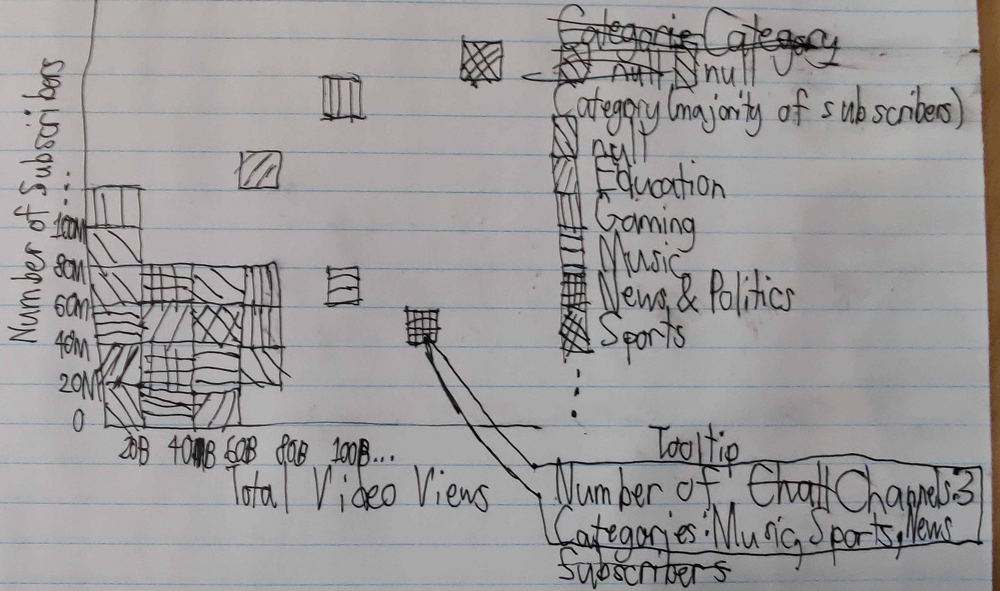

*Note:* Categories are encoded by colour.

Pros:
- Anomalies in both subscriber count and viewer count are apparent from where they are on the heatmap
- Tooltips allow readers to figure out which categories are in which areas

Cons:
- In the more common bins (the bottom left corner in this case), it is difficult to determine any patterns in the categories because they all overlap. Even though the categories in the bin are present, analysis would require checking the tooltips of every relevant bin, which is very tedious

Low-Fidelity Sketch 3:

In [49]:
alt.Chart(youtube_data).mark_bar().encode(
    alt.X("subscribers:Q", bin = alt.BinParams(maxbins = 20), title = "Number of Subscribers"),
    alt.Y("count(category)", title = "Number of Channels"),
    alt.Color("category:N", title = "Category"),
    tooltip = [alt.Tooltip("category", title = "Category: "),
               alt.Tooltip("sum(video_views)", title = "Total Video Views: "),
               alt.Tooltip("sum(subscribers)", title = "Total Subscribers: ")]
)

alt.Chart(...)

Pros:
- Stacked bars show how many channels in each bin are in each category, so outliers can be seen in other bins with different numbers of subscribers
- Minimal interference in the larger bars

Cons:
- The names of the channels that represent the outliers are not visible
- Because of the large total bars on the left side of the histogram, the bars on the right are very small and difficult to read. This could be fixed by normalizing the bars

**High-Fidelity Sketch**

There are too many points that have a lower number of subscribers and video views to encode `subscribers` on the x-axis and `video_views` on the y-axis. Additionally, binning these values would place all of the channels into groups, which would prevent readers from viewing the channel names of the anomalies. Reducing the number of points may aid in reducing interference. One way to reduce the number of points without removing the anomalies is to remove youtubers that have both a subscriber count and video view count within some range of their category's mean subscriber count and mean video view count. In this example, I use one standard deviation as the range.

This requires three steps:
1. Finding the category means and standard deviations
2. Add the category means to a copy of the dataset
3. Filter the rows
4. Plot the remaining observations

Step 1: Find means and standard deviations. I will use a for loop to iterate through each possible category and add the means and standard deviations to a dictionary. Some categories are `pd.NaN`, so I use `fillna` to place all of those into one category.

In [50]:
youtube_summary_stats_category = {}

# Use a copy of the dataset to stop modifications of the original
new_youtube_data = youtube_data[:]
# Fill the NA values in category only
new_youtube_data["category"] = new_youtube_data["category"].fillna("Not Available")

# Add means and standard deviations to dictionary
for c in new_youtube_data["category"].unique():
    youtube_summary_stats_category[c] = {"subscribers_mean" : new_youtube_data.loc[new_youtube_data["category"] == c]["subscribers"].mean(),
                                         "video_views_mean" : new_youtube_data.loc[new_youtube_data["category"] == c]["video_views"].mean(),
                                         "subscribers_std" : new_youtube_data.loc[new_youtube_data["category"] == c]["subscribers"].std(),
                                         "video_views_std" : new_youtube_data.loc[new_youtube_data["category"] == c]["video_views"].std()}
# Sample for viewing
youtube_summary_stats_category["Music"]

{'subscribers_mean': 25717821.78217822,
 'video_views_mean': 15452858943.727722,
 'subscribers_std': 21079064.127363272,
 'video_views_std': 17782784424.30969}

Step 2: Transfer means and standard deviations to dataset copy.

In [51]:
# Add means and standard deviations to dataset copy
for c in new_youtube_data["category"].unique():
    new_youtube_data.loc[new_youtube_data["category"] == c, "subscribers_mean"] = youtube_summary_stats_category[c]["subscribers_mean"]
    new_youtube_data.loc[new_youtube_data["category"] == c, "video_views_mean"] = youtube_summary_stats_category[c]["video_views_mean"]
    new_youtube_data.loc[new_youtube_data["category"] == c, "subscribers_std"] = youtube_summary_stats_category[c]["subscribers_std"]
    new_youtube_data.loc[new_youtube_data["category"] == c, "video_views_std"] = youtube_summary_stats_category[c]["video_views_std"]

# Remove NA value edits to category
new_youtube_data["category"] = youtube_data["category"]
new_youtube_data.head()

,youtuber,subscribers,video_views,category,title,uploads,country,abbreviation,channel_type,video_views_rank,...,latitude,longitude,created_date,unemployment_rate_ordinal,education_enrollment_ordinal,intercept,subscribers_mean,video_views_mean,subscribers_std,video_views_std
rank,,,,,,,,,,,,,,,,,,,,,
1,T-Series,245000000,2.280000e+11,Music,T-Series,20082,India,IN,Music,1.0,...,20.593684,78.962880,2006-03-13,Moderate,Low,1,2.571782e+07,1.545286e+10,2.107906e+07,1.778278e+10
2,YouTube Movies,170000000,0.000000e+00,Film & Animation,youtubemovies,1,United States,US,Games,4055159.0,...,37.090240,-95.712891,2006-03-05,High,High,1,2.858478e+07,1.183527e+10,2.523212e+07,1.089955e+10
3,MrBeast,166000000,2.836884e+10,Entertainment,MrBeast,741,United States,US,Entertainment,48.0,...,37.090240,-95.712891,2012-02-20,High,High,1,2.140332e+07,1.048854e+10,1.392571e+07,1.012820e+10
4,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,Education,Cocomelon - Nursery Rhymes,966,United States,US,Education,2.0,...,37.090240,-95.712891,2006-09-01,High,High,1,2.654222e+07,1.548032e+10,2.484001e+07,2.557214e+10
5,SET India,159000000,1.480000e+11,Shows,SET India,116536,India,IN,Entertainment,3.0,...,20.593684,78.962880,2006-09-20,Moderate,Low,1,4.161538e+07,3.432360e+10,4.113913e+07,4.372389e+10


Step 3: Filter dataset copy to only contain youtubers whose subscriber count or video views are more than one standard deviation away from that category's mean subscriber count or mean video views.

In [52]:
# anomalies_youtube_data only contains the filtered observations of youtube_data
anomalies_youtube_data = new_youtube_data[:]
anomalies_youtube_data = anomalies_youtube_data.loc[(abs(anomalies_youtube_data["subscribers"] -
                                                         anomalies_youtube_data["subscribers_mean"]) >
                                                     anomalies_youtube_data["subscribers_std"]) |
                                                   (abs(anomalies_youtube_data["video_views"] -
                                                         anomalies_youtube_data["video_views_mean"]) >
                                                     anomalies_youtube_data["video_views_std"])]
anomalies_youtube_data.head()

,youtuber,subscribers,video_views,category,title,uploads,country,abbreviation,channel_type,video_views_rank,...,latitude,longitude,created_date,unemployment_rate_ordinal,education_enrollment_ordinal,intercept,subscribers_mean,video_views_mean,subscribers_std,video_views_std
rank,,,,,,,,,,,,,,,,,,,,,
1,T-Series,245000000,2.280000e+11,Music,T-Series,20082,India,IN,Music,1.0,...,20.593684,78.962880,2006-03-13,Moderate,Low,1,2.571782e+07,1.545286e+10,2.107906e+07,1.778278e+10
2,YouTube Movies,170000000,0.000000e+00,Film & Animation,youtubemovies,1,United States,US,Games,4055159.0,...,37.090240,-95.712891,2006-03-05,High,High,1,2.858478e+07,1.183527e+10,2.523212e+07,1.089955e+10
3,MrBeast,166000000,2.836884e+10,Entertainment,MrBeast,741,United States,US,Entertainment,48.0,...,37.090240,-95.712891,2012-02-20,High,High,1,2.140332e+07,1.048854e+10,1.392571e+07,1.012820e+10
4,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,Education,Cocomelon - Nursery Rhymes,966,United States,US,Education,2.0,...,37.090240,-95.712891,2006-09-01,High,High,1,2.654222e+07,1.548032e+10,2.484001e+07,2.557214e+10
5,SET India,159000000,1.480000e+11,Shows,SET India,116536,India,IN,Entertainment,3.0,...,20.593684,78.962880,2006-09-20,Moderate,Low,1,4.161538e+07,3.432360e+10,4.113913e+07,4.372389e+10


Step 4: Plot the filtered data.

In [53]:
alt.Chart(anomalies_youtube_data).mark_point().encode(
    alt.X("subscribers:Q", title = "Number of Subscribers"),
    alt.Y("video_views:Q", title = "Number of Video Views"),
    alt.Color("category:N", title = "Category"),
    tooltip = [alt.Tooltip("youtuber", title = "Channel Name: "),
               alt.Tooltip("category", title = "Category: "),
               alt.Tooltip("video_views", title = "Total Video Views: "),
               alt.Tooltip("subscribers", title = "Total Subscribers: ")]
)

alt.Chart(...)

The visualization adheres to the principle of effectiveness by using the most effective channels for the subscriber count and video view count: x and y. Although some interference from the dense coloured points exists, it is significantly reduced by about fivefold by removing youtubers that are too close to the means of their categories. The points farther from the category means are more likely to be anomalies, so they are preserved. Additionally, since they are not in the dense areas, readers can still easily access their channel names and other details using the tooltips, which allows more information to be encoded without interference. 

## Part IV: Next Steps

Step 1: Refinement and Advanced Visualization Implementation (Nov 7 - Nov 12)
- Zicheng Zhao will refine the visual encodings for clarity and consistency, ensuring meeting the requirements and supporting the tasks.
- Herman Liao will work on refining the high-fidelity sketches based on feedback from Milestone I and begin translating these into interactive visualizations.
- Dorothy Ger will draft a plan for the presentation and video summary structure.

Step 2: Interaction Development and UI Integration (Nov 13 - Nov 19)
- Zicheng Zhao will implement interactive features and ensure at least one advanced interaction technique is integrated.
- Herman Liao will collaborate on the interaction design, providing input on user experience.
- Dorothy Ger will start documenting the visualizations and interactions for the report, aligning with the visualization choices and user tasks.

Step 3: Interface Optimization (Nov 20 - Nov 26)
- Zicheng Zhao will ensure the layout uses screen space efficiently and visualizations are responsive to different screen sizes if applicable.
- Herman Liao will create legends, axis labels, explanatory text, etc, enhancing the overall comprehensibility of the visualizations.
- Dorothy Ger will enhance the report, incorporating the design choices, interaction techniques, etc, behind each visualization.

Step 4: Testing (Nov 27 - Nov 28)
- Zicheng Zhao will test all interactive elements for functionality and fix any bugs.
- Herman Liao will refine the visualizations based on input.
- Dorothy Ger will conduct a peer review of the report and presentation script.